<a href="https://colab.research.google.com/github/semueller/LecturePatternRec2_Draft/blob/main/ExercisesJupyter/exercise5/PR_sheet5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%matplotlib inline
import numpy as np
import numpy.linalg as la
import numpy.random as rnd
import pandas as pd

import matplotlib.colors as clr
import matplotlib.pyplot as plt
import matplotlib.cm as cm

import imageio as imageio
from IPython import display

import scipy.spatial as spt
import scipy.cluster.vq as vq
from scipy.sparse import diags
from scipy.spatial.distance import cdist
from scipy.integrate import odeint

In [3]:
try:
    from google.colab import drive
    drive.mount('/content/drive')
    data_file_path = "/content/drive/MyDrive/ColabNotebooks/PR2Sheet5/Data/"

except ModuleNotFoundError as mnfe:
    print(mnfe)
    data_file_path="./Data/"

finally:
    print(f"filepath: {data_file_path}")

Mounted at /content/drive
filepath: /content/drive/MyDrive/ColabNotebooks/PR2Sheet5/Data/


### Utility functions:

#### Image construction and display:

In [4]:
def imageWrite(f, filename):
    imageio.imwrite(filename, f.astype('uint8'))

In [5]:
def arrangeOnGrid(X, nx, ny, w, h, bg, delta):
    dim, num = X.shape

    if w is None and h is None:
        w = int(np.sqrt(dim)) # small image width
        h = w                 # small image height

    I = np.ones((ny*(delta+h), nx*(delta+w)), dtype=np.uint8) * bg

    for i in range(ny):
        for j in range(nx):
            x = X[:,i*nx+j].reshape(h,w)

            ilow = i*(h+delta) + delta//2
            jlow = j*(w+delta) + delta//2
            ihgh = i*(h+delta) + delta//2 + h
            jhgh = j*(w+delta) + delta//2 + w

            I[ilow:ihgh,jlow:jhgh] = x

    return I

In [6]:
def showImages(X, nx, ny, fname, w=None, h=None, bg=255, delta=2):
    image_ndarray = arrangeOnGrid(X, nx, ny, w, h, bg, delta)
    imageWrite(image_ndarray, fname)
     
    return image_ndarray

In [7]:
def plotDataAndPrototypes(X, W=None, fname=None, plot_title=None):
    blu = '#0059ff' 
    ora = '#ffa500'
    
    fig = plt.figure()
    fig.patch.set_facecolor('w')

    axs = fig.add_subplot(111, facecolor='w')
    axs.set_aspect(aspect='equal')

    for pos in ['left','bottom']:
        axs.spines[pos].set_position('zero')
        axs.spines[pos].set_zorder(1)

    for pos in ['right','top']:
        axs.spines[pos].set_visible(False)

    axs.xaxis.set_ticks_position('bottom')
    axs.yaxis.set_ticks_position('left')
    axs.tick_params(direction='out')

    axs.plot(X[0,:], X[1,:], 'o', c=ora, ms=7, mew=0, alpha=0.50)

    if W is not None:
        axs.plot(W[0,:], W[1,:], 's', c=blu,
                 fillstyle='none', ms=9, mew=1,alpha=0.75)

    minX = np.min(X, axis=1)
    maxX = np.max(X, axis=1)
    difX = maxX - minX
    axs.set_xlim(minX[0] - 0.1*difX[0], maxX[0] + 0.1*difX[0])
    axs.set_ylim(minX[1] - 0.1*difX[1], maxX[1] + 0.1*difX[1])


    if fname is None:
        plt.show()
    else:
        fmt = fname.split('.')[-1]
        fig.savefig(fname, facecolor=fig.get_facecolor(), edgecolor='w', # papertype='letter',
                    format=fmt, transparent=False,
                    bbox_inches='tight', pad_inches=0)  
    

    if plot_title is not None:
        plt.title(plot_title)

    plt.show()        
    plt.close()

#### Basic operations:

In [8]:
def SQEDMX(X):
    return spt.distance.squareform(spt.distance.pdist(X.T, 'sqeuclidean'))

In [9]:
def SQEDMXY(X,Y):
    return spt.distance.cdist(X.T, Y.T, 'sqeuclidean')

In [10]:
def standardize(X):
    m, n = X.shape
    mean = X.mean(axis=1).reshape(m,1)
    variance = X.std(axis=1).reshape(m,1)
    variance[variance==0] = 1.
    
    return (X-mean) / variance, mean, variance

#### Hopfield networks:

In [11]:
def signum(x):
    return np.where(x >= 0, +1, -1)

In [12]:
def hnetEnergy(vecS, matW, vecT):
    return -0.5 * vecS @ matW @ vecS + vecT @ vecS

In [13]:
def hnetRunGreedy(vecS, matW, vecT, tmax=100):
    for t in range(tmax):
        grad = matW @ vecS - vecT
        dltH = vecS * grad
        updt = np.argmin(dltH)
        vecS[updt] = signum(grad[updt])     

    return vecS

In [14]:
def run_hopfield_net(state_vector, weight_matrix, bias_vector, mode, t_max=100, temperature_high=10, temperature_low=0.5,
                           steps=21, verbose=False):
    """
        Runs a hopfield network on the given mode. Avaliable modes are:
        'greedy', 'random', 'round robin' and 'simulated annealing'

        Default mode is 'greedy'.
    """
    # Random
    if mode == 'random':
        for t, u in enumerate(rnd.randint(0, len(state_vector), t_max)):
            if verbose:
                hnet_print_time_state_energy(state_vector, weight_matrix, bias_vector, t)

            state_vector[u] = signum(weight_matrix[u] @ state_vector - bias_vector[u])

    # Round robin
    elif mode == 'round robin':
        t = 0
        for r in range(t_max):
            for neuron in range(len(state_vector)):
                if verbose:
                    hnet_print_time_state_energy(state_vector, weight_matrix, bias_vector, t)

                state_vector[neuron] = signum(weight_matrix[neuron] @ state_vector - bias_vector[neuron])

                t += 1

    # Simulated annealing
    elif mode == 'simulated annealing':        
        vecX = np.copy(state_vector)
        t = 0
        for T in np.linspace(temperature_high, temperature_low, steps):
            for r in range(t_max):
                if verbose:
                    hnet_print_time_state_energy(state_vector, weight_matrix, bias_vector, t)
                    
                for neuron in range(len(state_vector)):
                    q = 1 / (1 + np.exp(-2/T * (weight_matrix[neuron] @ state_vector - bias_vector[neuron])))
                    z = rnd.binomial(n=1, p=q)
                    state_vector[neuron] = 2 * z - 1

                    t = t+1
    
    else:
        # Greedy updates
        for t in range(t_max):
            if verbose:
                hnet_print_time_state_energy(state_vector, weight_matrix, bias_vector, t)

            gradient = weight_matrix @ state_vector - bias_vector
            deltas = state_vector * gradient
            update_neuron = np.argmin(deltas)
            state_vector[update_neuron] = signum(gradient[update_neuron])

    
    return state_vector

# Pattern Recognition 2 - Assignment 5

---
## Exercise 1 - Spectral clustering

In the data folder for this exercise, you will find the file `faceMatrix.npy` which contains a data matrix $X\in\mathbb{R}^{361\times 2429}$ whose columns $x_i$ represent tiny face images of size $19\times 19$ pixels. To read this matrix into memory and to reduce it down to $1000$ images, you may use the following code snippet:

In [15]:
matX = np.load(data_file_path+"faceMatrix.npy").astype("float")

matX = matX[:,:1000]
m, n = matX.shape

From now on, we will refer to the array `matX` as the data matrix $X$ and to its $n$ individual columns as the data points $x_j$. In the following three subtasks, we are concerned with spectral clustering of this data. This requires
two preparatory steps:
1. For many reasons, it is a good idea to first standardize the data $X$.
So go ahead and store the standardized data (zero mean and unit variance in each dimension) in a matrix $Y$.
1. Given $Y$, compute a (squared) Euclidean distance matrix $\Delta\in\mathbb{R}^{n\times n}$
where
$$ \Delta_{i,j} = ||y_i − y_j||^2 $$
Given $\Delta$, compute the average distance between pairs of data points:
$$ \hat{\delta} = \frac{1}{n^2} \sum\limits_{i=1}^{n} \sum\limits_{j=1}^{n} \Delta_{i,j} $$

In [16]:
# Standardize the data
matY, _, _ = standardize(matX)

In [18]:
# Compute the squared Euclidean distance matrix (Delta)
matDist = SQEDMX(matY)

# Compute the average distance between pairs of data points (delta hat)
average_distance = np.mean(matDist)

722.0000000000001


### 1.1. Sub-task

Spectral clustering basically analyzes properties of the adjacency matrix $A$ of a graph $G$. To compute several adjacency matrices from the above distance matrix use
$$ A_{i,j} = \begin{cases}
1 & \text{if }\Delta_{i,j} \le \epsilon\\
0 & \text{otherwise}
\end{cases}$$
where $\epsilon = s* \hat{\delta}$ and $s\in\{1.00, 0.75, 0.50, 0.25\}$.

> **Hint**: In other words, disregard all distances that are larger than 100%, 75%, 50% oder 25% of the average distance. All shorter distances are interpreted as of unit lenght ($\epsilon$-graph).

For each of the resulting adjacency matrices compute the corresponding degree matrix $D=\text{diag}[A \ \textbf{1}]$ and the Laplacian $L =D-A$. 

For each of the resuling Laplacians, compute the spectral decomposition
$$ L=U\Delta U^\intercal $$

Now, remember that the number of zero eigenvalues on the diagonal of $\Lambda$ indicates the number of distinct connected components in $G$. Determine this number for each of the graphs whose Laplacians you just computed.

**Note**: When we are using numerical software to compute the spectral decomposition of $L$, then numerical instabilities will make it unlikely that the diagonal entries of $\Lambda$ are exactly zero. Take this into account when solving
this sub-task.

In [ ]:
eps_choices = np.array([1.00, 0.75, 0.50, 0.25]) * average_distance

for eps in eps_choices:
    # Compute the adjacency matrix for the epsilon-graph G
    matAdj = np.where(matDist < eps, 1., 0.)
    matAdj = matAdj - np.eye(matAdj.shape[0])  # to remove self-connections, does not have a visible impact on the result though
    
    # Compute the degree matrix by summing over the rows of the adjacency matrix
    matDeg = np.diag(np.sum(matAdj, axis=1))

    # Compute the Laplacian
    matLap = matDeg - matAdj

    # Compute the spectral decomposition of the Laplacian
    vecL, matU = la.eigh(matLap)

    # Identify the number of eigenvalues that are "almost zero"
    # That is the number of connected components in the graph G
    numConnect = np.sum(vecL < 1e-8)
    print(f"For epsilon = {round(eps, 2)} there are\t{numConnect} connected components.")

For epsilon = 722.0 there are	1 connected components.
For epsilon = 541.5 there are	1 connected components.
For epsilon = 361.0 there are	2 connected components.
For epsilon = 180.5 there are	89 connected components.


### 1.2. Sub-task

For this sub-task, compute the adjacency matrix $A$ of the graph representation of the data in $X$ as follows
$$ A_{i,j} = \begin{cases}
1 & \text{if }\Delta_{i,j} \le \epsilon\\
0 & \text{otherwise}
\end{cases}$$

Given this adjacency matrix $A$, compute the degree matrix $D = \text{diag}[A\ \textbf{1}]$, the Laplacian $L = D − A$, and its spectral decomposition $L = U \Lambda U^\intercal$.

Assuming the eigenvectors of $L$ are ordered as $0 = \lambda_1 \le \lambda_2 \le \dots \le \lambda_n$,
we refer to the eigenvector $u_2$ belonging to the second smallest eigenvalue $\lambda_2$ as the **Fiedler vector** $f$ of the graph $G$ that represent our data. Use the
Fiedler vector to cluster the data into two clusters $X_1$ and $X_2$ where
$$ X_1 = \{x_j| \ f_j \ge 0\}\qquad\text{and}\qquad X_2 = \{x_j| \ f_j< 0\} $$

Create plots of the first $25$ face images in each cluster.

> **Note**: In the smallest eigenvalue of $L$ is always $0$, since 
$$ \textbf{1} := \begin{bmatrix}1 \\ 1 \\ 1\\ \dots \\ 1 \end{bmatrix}$$
is an eigenvector for $0$:

> Multiplying the $i$-th row of the degree matrix $D$ by $\textbf{1}$ yields the degree of node $i$. And multiplying the $i$-th row of $A$ by $\textbf{1}$ sums that row, which is also the degree of node $i$ (that is how $D$ was constructed in the first place). Thus $$L\textbf{1} = D\textbf{1} - A\textbf{1} = 0$$

> [Fiedler vector according to mathworld](https://mathworld.wolfram.com/FiedlerVector.html)

> ["The second smalles eigenvector give a continuous measure of how well a graph is connected"](https://www.johndcook.com/blog/2016/01/07/connectivity-graph-laplacian/)

In [17]:
eps = average_distance

# As above, compute the adjacency matrix, degree matrix and Laplacian matrix
matAdj = np.where(matDist < eps, 1., 0.)
matAdj = matAdj - np.eye(matAdj.shape[0])
matDeg = np.diag(np.sum(matAdj, axis=1))
matLap = matDeg - matAdj

eigenvalues, eigenvectors = la.eigh(matLap)

In [18]:
# Get eigenvector (a.k.a. the Fiedler vector), corresponding to the second smalles eigenvalue
vecF = eigenvectors[:,1]
# Create binary masks w.r.t. the Fiedler vector
mask_ge = vecF >= 0
mask_l = vecF < 0

print(f"Size of cluster 1: {np.sum(mask_ge)}")
print(f"Size of cluster 2: {np.sum(mask_l)}")

Size of cluster 1: 336
Size of cluster 2: 664


In [ ]:
# Cluster the data w.r.t. the Fiedler vector masks
matX_ge = matX[:,mask_ge]
matX_l = matX[:,mask_l]

In [ ]:
# Plot the first 25 face images
n_images = 25
n_col = int(np.sqrt(n_images))
n_row = n_col

images_ge = showImages(matX_ge[:,-n_images:], n_col, n_row, fname='t5-1-c1.png')
images_l = showImages(matX_l[:,-n_images:], n_col, n_row, fname='t5-1-c2.png')

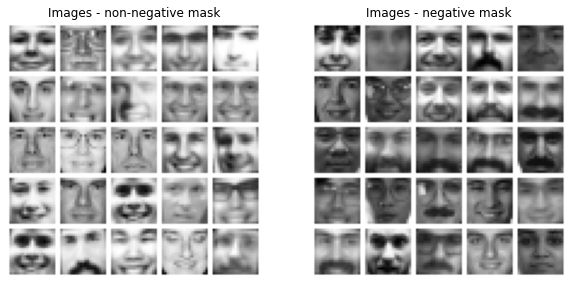

In [ ]:
fig = plt.figure(figsize=(10, 7)) 

fig.add_subplot(1, 2, 1)
plt.imshow(images_ge, cmap='gray')
plt.axis('off')
plt.title("Images - non-negative mask")

fig.add_subplot(1, 2, 2)
plt.imshow(images_l, cmap='gray')
plt.axis('off')
plt.title("Images - negative mask")

plt.show()

> **Summary**: we compted distances between all images and represented them in an $\epsilon$-graph. Then we used the Fiedler vector as a threshold to split the graph into two more
connected subgraphs. The images corresponding to these subgraphs (masks) are displayed. That is why the pairwise distances within one set of images is smaller than between the different sets.

### 1.3. Sub-task

Consider the matrices $A$, $D$ and $L$ you computed in the previous sub-task and determine the spectral decomposition $L=U\Lambda U^\intercal$. 

Again, assuming the eigenvectors of $L$ are ordered as $0 = \lambda_1 \le \lambda_2 \le \dots \le \lambda_n$, chose an integer $k>2$ and compute the matrix
$$ U_k = \begin{bmatrix} u_2 & u_3 & \dots & u_{k+1} \end{bmatrix}$$

Given $U_k$, use $k$-means clustering to cluster its $n$ rows into $k$ clusters. If you use `scipy.cluster.vq.kmeans2` for this purpose, you will get (among
others) a list of $n$ cluster labels $l_j \in \{0, 1, \dots , k − 1\}$. Use these cluster labels to compute $k$ mean images
$$ \mu_i = \frac{1}{n_i} \sum\limits_{l_j = i} x_j $$

where $n_i$ denotes the number of elements in cluster $C_i$. Plot your resulting mean images.

**Note**: Theoretically, this approach works fine. Yet, practically, you may run into difficulties. Depending on how you choose $k$ and how you use `scipy.cluster.vq.kmeans2`, you may succeed or fail. The following result was obtained for $k=5$ and shows that things can work out.

In [24]:
k = 5
k_biggest_eigenvectors = eigenvectors[:,1:k+1]

In [25]:
# Clustering the k biggest eigenvalue entries into k clusters
_, labels = vq.kmeans2(k_biggest_eigenvectors, k, minit='points')
print(labels)

[1 3 1 4 1 4 1 3 3 4 1 3 3 3 1 0 0 4 4 1 4 3 1 1 3 3 1 4 1 1 4 4 1 1 1 3 0
 3 1 1 3 4 0 1 3 3 0 3 0 3 1 4 3 1 4 4 4 1 4 4 4 3 4 4 4 1 4 4 1 3 1 1 1 0
 4 1 1 4 4 1 4 3 4 3 3 4 3 1 1 3 4 1 4 4 1 4 1 4 4 3 1 1 0 3 4 4 3 3 1 4 1
 1 1 4 0 1 3 1 1 3 3 3 1 4 3 4 1 4 3 3 3 1 3 4 3 4 1 1 1 4 4 1 1 0 0 1 1 4
 0 4 3 3 1 4 4 3 3 1 4 4 3 3 1 3 1 4 1 4 4 3 1 3 3 3 4 4 3 0 4 0 4 0 3 1 4
 4 4 4 4 1 3 0 0 4 1 1 4 4 4 3 0 4 3 1 3 4 3 4 0 3 3 4 0 4 4 1 3 4 1 4 1 0
 4 3 0 1 4 4 3 3 1 4 0 0 4 1 3 1 4 3 3 3 3 4 0 4 1 1 1 1 4 4 3 1 1 1 4 1 4
 4 4 4 4 0 1 3 4 3 1 0 3 1 3 1 4 3 3 4 4 4 4 4 1 1 4 0 4 3 1 4 3 3 3 0 1 4
 1 4 4 3 3 4 4 3 4 1 0 4 1 3 1 3 3 1 4 4 4 4 4 4 1 1 4 1 3 3 3 1 1 4 4 1 0
 4 4 1 4 1 3 4 4 0 4 1 3 1 4 4 4 0 4 4 1 1 4 1 1 4 3 1 1 4 1 1 3 3 1 1 3 1
 4 4 4 1 4 4 4 3 1 4 4 3 1 3 1 0 4 4 4 3 3 1 0 3 3 4 4 1 3 1 0 3 1 4 1 1 0
 4 4 1 3 1 3 4 0 4 1 3 1 1 4 4 4 4 4 1 4 4 0 1 1 1 0 1 1 3 4 1 4 1 4 4 1 0
 4 3 4 3 4 1 4 4 1 1 1 3 4 4 4 3 1 4 4 4 4 4 4 3 4 1 3 4 3 4 1 4 3 1 4 1 3
 3 3 4 1 1 4 4 1 3 1 3 0 

In [26]:
# Compute the k mean images
mat_clustermeans = np.hstack([np.mean(matX[:,labels==cluster_id], axis=1).reshape(m,1) for cluster_id in range(k)])

In [27]:
n_col = k
n_row = 1
image_means = showImages(mat_clustermeans, n_col, n_row, fname='t5-1-k-means.png')

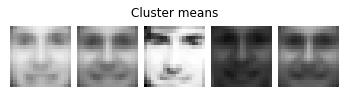

In [28]:
plt.imshow(image_means, cmap='gray')
plt.axis('off')
plt.title("Cluster means")
plt.show()
plt.close()

> As expected for cluster means, we can detect rather big differences between the selected images. (Especially compared to sub-task 1.1.)

### 1.3. Bonus task

Repeat all of the above without standardizing the data. Experiment with different ways of building an adjacency matrix from the Euclidean distance matrix. Experiment with different choices of $k$ for the combination of spectral- and $k$-means clustering. Discuss your observations.


In [ ]:
def compute_cluster_means(k, distance_mode, epsilon_scale, do_standardize=False):
    matX = np.load(data_file_path+"faceMatrix.npy").astype("float")
    matX = matX[:,:1000]
    m, n = matX.shape

    if do_standardize:    
        # Standardize the data
        matX, _, _ = standardize(matX)

    # Compute the squared Euclidean distance matrix (Delta)
    matDist = SQEDMX(matX)

    if distance_modes == 'min':
        np.fill_diagonal(matDist, np.infty)

    switcher = {
        # Compute the average distance between pairs of data points (delta hat)
        'avg': np.mean(matDist) * matDist.shape[0], # *n to cancel out self-similarities

        # Compute the maximum distance between pairs of data points
        'max': np.max(matDist),

        # Compute the minimum distance between pairs of data points - note that we sat
        # the distance between the same points (diagonal) to infinity first!
        'min': np.min(matDist),
    } 

    delta = switcher.get(distance_mode)

    epsilon = delta * epsilon_scale
    matAdj = np.where(matDist < epsilon, 1., 0.)
    matAdj = matAdj - np.eye(matAdj.shape[0])
    # Compute the degree matrix by summing over the rows of the adjacency matrix
    matDeg = np.diag(np.sum(matAdj, axis=1))

    # Compute the Laplacian
    matLap = matDeg - matAdj

    # Compute the spectral decomposition of the Laplacian
    vecL, matU = la.eigh(matLap)

    # Perform the decomposition of the Laplacian
    eigenvalues, eigenvectors = la.eigh(matLap)

    k_biggest_eigenvectors = eigenvectors[:,1:k+1]

    # Clustering the eigenvectors, corresponding to the k biggest eigenvalues into k clusters
    # _, labels = vq.kmeans2(k_biggest_eigenvectors, k, minit='points')
    _, labels = vq.kmeans2(k_biggest_eigenvectors, k, minit='++')
    
    # Compute the k mean images
    mat_clustermeans = np.hstack([np.mean(matX[:,labels==cluster_id], axis=1).reshape(m,1) for cluster_id in range(k)])

    n_col = k; n_row = 1
    image_means = showImages(mat_clustermeans, n_col, n_row, fname='t5-1-k-means.png')
    plt.imshow(image_means, cmap='gray')
    plt.axis('off')
    standardized_str = "standardized" if do_standardize else "not standardized"
    plt.title(f"k = {k}, distance mode = {distance_mode},\nepsilon scale = {epsilon_scale}, {standardized_str}")
    plt.show()
    plt.close()

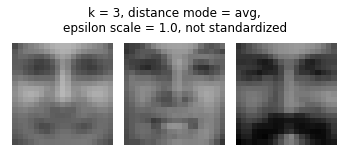

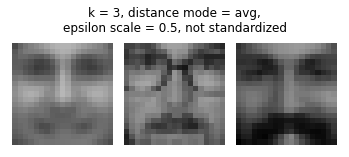

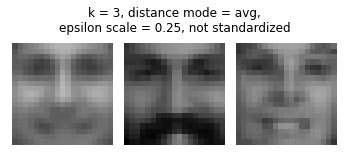

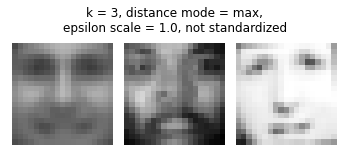

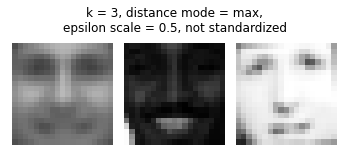

...

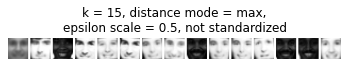

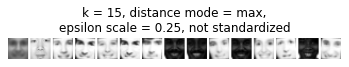

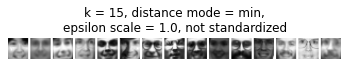

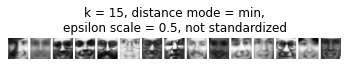

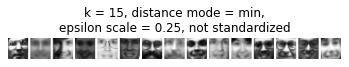

In [ ]:
k_values = [3, 5, 7, 10, 15]
distance_modes = ['avg', 'max', 'min']
epsilon_scales = [1.00, 0.5, 0.25]

for k in k_values:
    for d in distance_modes:
        for s in epsilon_scales:
            compute_cluster_means(k, d, s, do_standardize=False)

> By construction bigger $\epsilon$ yields in higher connectivity and thus less clusters. Similarly, a definition of smaller distances do the same (since more often the criteria $\Delta_{i,j}\le \epsilon$ is fulfilled).

> We notice, that using the minimum distance as distance measure between clusters does not work well. This corresponds to the explanation above. One can print the labels returned by 'vq.kmeans2' and notice, that **LESS than $k$** clusters are returned.

> Using the average distance and a rather small epsilon seems to be a good strategy.

Also notice, that we call `vq.kmeans2` with `minit:'++'`. This ensures that k-means starts with $k$ cluster centers that are selected by a more careful seeding (iteratively selecting random centres such that each point has probability of being selected of the square distance to the already selected).

Using the other options `minit:'random'` or `minit:'points'` may lead to empty clusters when using the minimum distance (not all $k$ labels are being used).

---
## Exercise 2 - Hopfield nets for graph cuts


Let $X\in\mathbb{R}^{361\times n}$ where $n=1000$ as in the previous task. Also let $A$ and $L$ as in sub-tasks 1.2 or 1.3. Using $A$ compute
- $d:= A\textbf{1}$
- $\eta:= \textbf{1}^\intercal d$
- $\lambda := \frac{2}{\eta}$


In [ ]:
# Load, standardize the data and compute the Euclidean distances
matX = np.load(data_file_path+"faceMatrix.npy").astype("float")
matX = matX[:,:1000]
matY, _, _ = standardize(matX)
m, n = matY.shape

In [ ]:
matDst = SQEDMX(matY)
mean_distance = np.mean(matDst)

matAdj = np.where(matDst < mean_distance, 1., 0.) # A
matDeg = np.diag(np.sum(matAdj, axis=1)) # D
vecDeg = np.diag(matDeg) # eta
matLap = matDeg - matAdj # L

l = 2 / np.sum(vecDeg) # lambda

In lecture 16, we saw that the problem of computing a (normalized) graph cut can be expressed in terms of a QUBO, namely
$$ s^* = \text{argmin}_{s\in\{ -1,+1 \}^n} \ s^\intercal [L+\lambda dd^\intercal] s $$ 

Hence, if we define 
- $\Theta := 0$
- $W := -2[L+\lambda dd^\intercal]$

we should expect that a Hopfield network can produce results similar to the ones in sub-task 1.2.

Therefore, implement a Hopfield net that partitions the images $x_j$ in $X$ into two clusters
$$ X_1 = \{x_j| \ s_j^*> 0\}\qquad\text{and}\qquad X_2 = \{x_j| \ s_j^*< 0\} $$

For example, set the initial state of the Hopfield net to $s_0 = +1$, and use $t_{\max} = 1000$ iterations of the greedy neuron update mechanism.

> Note that we now expect, that the computed graph cut is similar to the continuous measure of how well connected the graph is (Fiedler vector).

In [ ]:
# Initialize the parameters of the HN
vecT = np.zeros(n) # Theta
matW = -2 * (matLap + l * np.outer(vecDeg, vecDeg))

# Make sure, that the weight matrix is hollow
np.fill_diagonal(matW, 0)

In [ ]:
# Initialize the initial state of the HN - Here we use a binomial distribution
vecS = np.ones(n)
vecS = 2 * rnd.binomial(n=1, p=0.5,  size=n) - 1

In [ ]:
# Run the HN
vecS = hnetRunGreedy(vecS, matW, vecT, tmax=1000)

In [ ]:
# Get the second smalles eigenvalue - a.k.a. the Fiedler vector
vecF = eigenvectors[:,1]

# Create binary masks w.r.t. the Fiedler vector
mask_ge = vecF >= 0
mask_l = vecF < 0

print (f"Size of cluster 1: {np.sum(mask_ge)}")
print (f"Size of cluster 2: {np.sum(mask_l)}")

# Cluster the data w.r.t. the Fiedler vector masks
matX_ge = matX[:,mask_ge]
matX_l = matX[:,mask_l]

# Plot the first 25 face images
n_images = 25
n_col = int(np.sqrt(n_images))
n_row = n_col

images_ge = showImages(matX_ge[:,-n_images:], n_col, n_row, fname='t5-2-c1.png')
images_l = showImages(matX_l[:,-n_images:], n_col, n_row, fname='t5-2-c2.png')

Size of cluster 1: 336
Size of cluster 2: 664


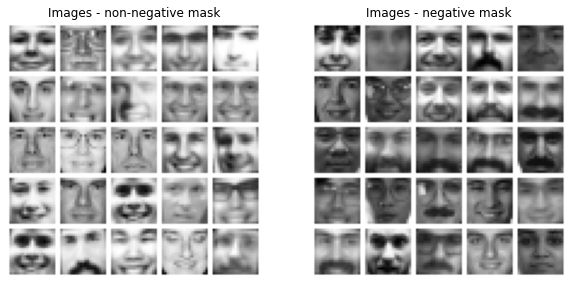

In [ ]:
fig = plt.figure(figsize=(10, 7)) 

fig.add_subplot(1, 2, 1)
plt.imshow(images_ge, cmap='gray')
plt.axis('off')
plt.title("Images - non-negative mask")

fig.add_subplot(1, 2, 2)
plt.imshow(images_l, cmap='gray')
plt.axis('off')
plt.title("Images - negative mask")

plt.show()

### 2.1. Bonus task

Conduct systematic experiments with different initial states $s_0$, different update mechanisms, different choices for the parameter $\lambda$. Maybe also experiment with different choices of the parameter when computing the
adjacency matrix $A$ from which $L$ and $d$ are computed. Report your observations.

In [ ]:
def graph_cut_via_different_HNs(matY, vecS, vecT, lambda_nominator, distance_mode, update_mode):
    # Compute the squared Euclidean distance matrix (Delta)
    matDist = SQEDMX(matX)

    switcher = {
        # Compute the average distance between pairs of data points (delta hat)
        'avg': np.mean(matDist),

        # Compute the maximum distance between pairs of data points
        'max': np.max(matDist),

        # Compute the minimum distance between pairs of data points
        'min': np.min(matDist),
    } 
    epsilon = switcher.get(distance_mode)
    matAdj = np.where(matDist < epsilon, 1., 0.)
    # Compute the degree matrix by summing over the rows of the adjacency matrix
    matDeg = np.diag(np.sum(matAdj, axis=1))
    # Compute the Laplacian
    matLap = matDeg - matAdj

    matDeg = np.diag(np.sum(matAdj, axis=1)) # D
    vecDeg = np.diag(matDeg) # eta
    l = lambda_nominator / np.sum(vecDeg) # lambda

    # Initialize the weight matrix
    matW = -2 * (matLap + l * np.outer(vecDeg, vecDeg))

    # Make sure, that the weight matrix is hollow
    np.fill_diagonal(matW, 0)

    # Run the HN with the given mode
    vecS = run_hopfield_net(vecS, matW, vecT, update_mode)

    # Create binary masks w.r.t. optimized state vecS
    mask_ge = vecS >= 0
    mask_l = vecS < 0
    # Cluster the data w.r.t. the Fiedler vector masks
    matX_ge = matX[:,mask_ge]
    matX_l = matX[:,mask_l]
    # Plot the first 25 face images
    n_images = 25; n_col = int(np.sqrt(n_images)); n_row = n_col
    images_ge = showImages(matX_ge[:,-n_images:], n_col, n_row, fname='t5-2-c1.png')
    images_l = showImages(matX_l[:,-n_images:], n_col, n_row, fname='t5-2-c2.png')

    fig = plt.figure(figsize=(10, 7)) 
    fig.suptitle(f"$\lambda$={lambda_nominator}$/\eta$,\t{distance_mode}-distances,\t'{update_mode}'-HNet", y=0.8)
    fig.subplots_adjust(top=0.8)
    fig.add_subplot(1, 2, 1)
    plt.imshow(images_ge, cmap='gray')
    plt.axis('off')
    plt.title("Images - non-negative mask")

    fig.add_subplot(1, 2, 2)
    plt.imshow(images_l, cmap='gray')
    plt.axis('off')
    plt.title("Images - negative mask")

    plt.show()
    plt.close()
    print()

In [ ]:
# Load, standardize the data and compute the Euclidean distances
matX = np.load(data_file_path+"faceMatrix.npy").astype("float")
matX = matX[:,:1000]
matY, _, _ = standardize(matX)

vecT = np.zeros(n) # Theta

#### Initialize parameter domains for grid search:

In [ ]:
# Initialize different update mechanisms
update_mechanisms = ['greedy', 'random', 'round robin', 'simulated annealing']

# Initialize different initial states
vecS_ones = np.ones(n)
vecS_minus_ones = -np.ones(n)
vecS_binomial = 2 * rnd.binomial(n=1, p=0.5,  size=n) - 1
vecS_random = (2*np.random.randint(0, 2, size=n)-1)

initial_states = [vecS_ones, vecS_minus_ones, vecS_binomial, vecS_random]

# Initialize different scales for lambdas. Lambda will depend on the degree matrix
# and thus also on the definitino of the adjacency matrix
lambda_nominators = [1, 2, 4, 6]

distance_modes = ['avg', 'max', 'min']

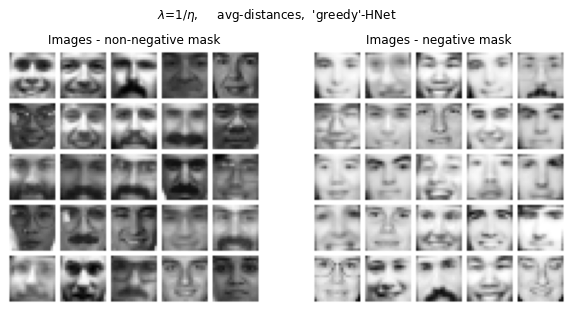

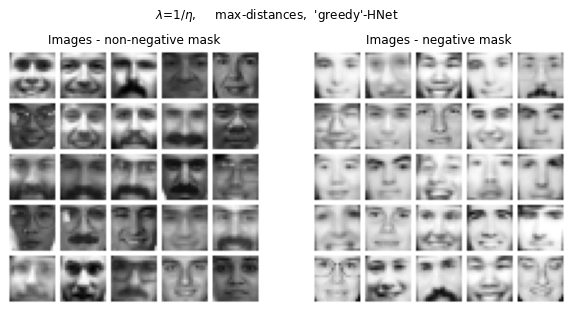

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: RuntimeWarning: divide by zero encountered in double_scalars
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: RuntimeWarning: invalid value encountered in multiply


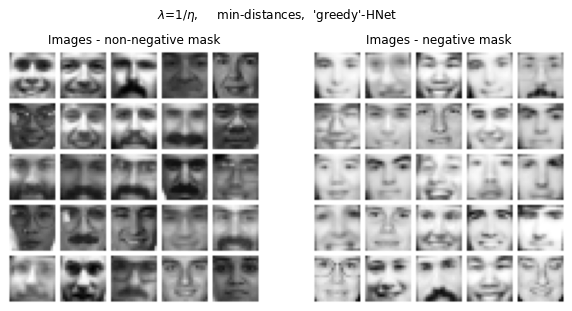

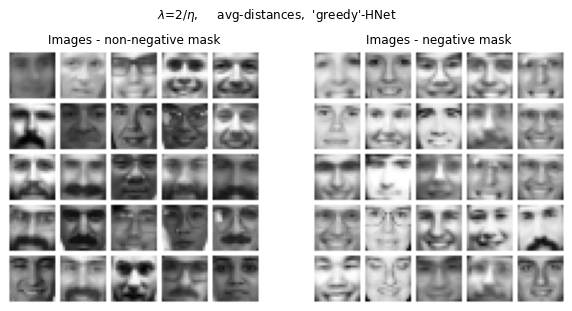

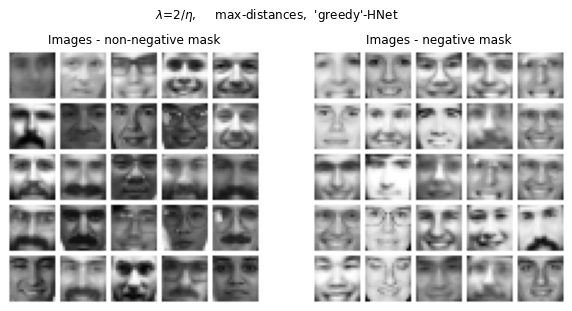

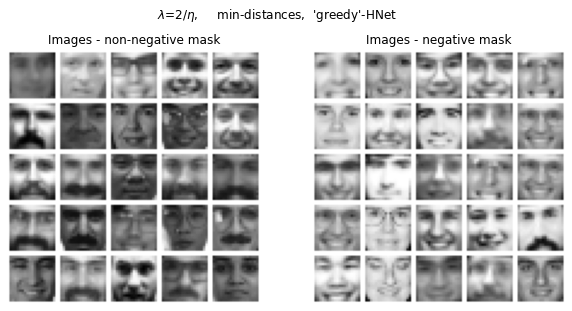

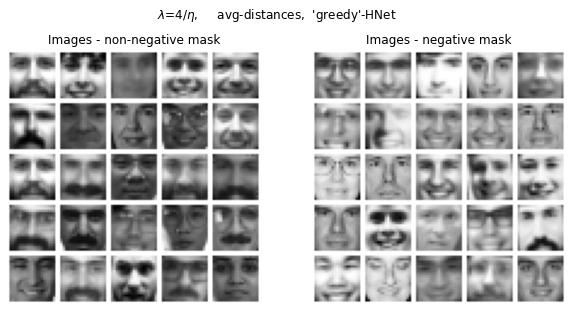

...

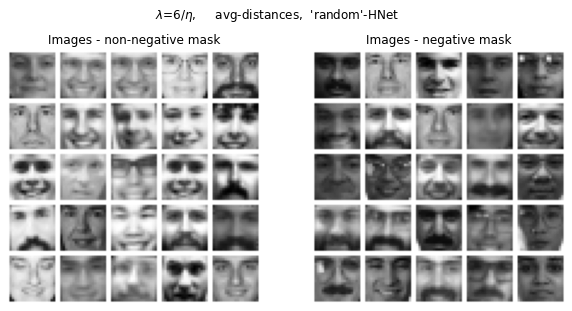

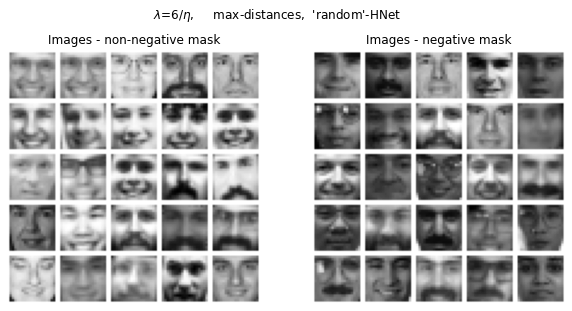

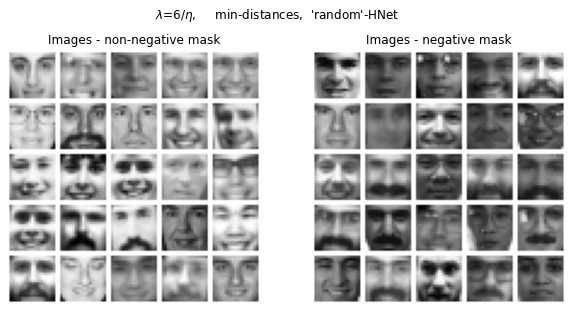

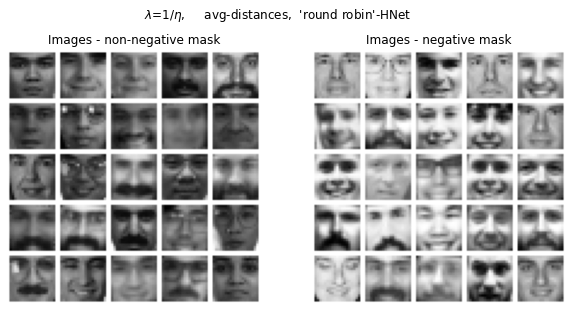

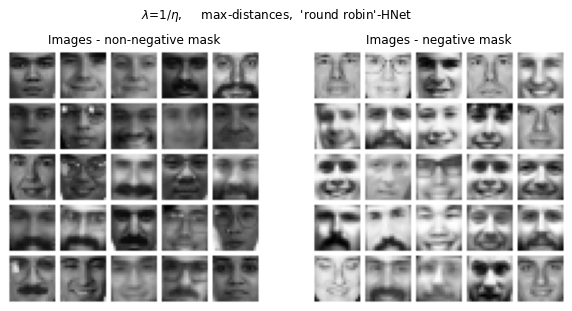

IndexError: ignored

In [ ]:
# Execute the grid-search-initializations
for update_mode in update_mechanisms:
    for initial_state in initial_states:
        for l_nominator in lambda_nominators:
            for dist_mode in distance_modes:
                graph_cut_via_different_HNs(matY, initial_state, vecT, l_nominator, dist_mode, update_mode)

> We notice, that the most important parameter of the tested ones is $\lambda$. In general, smaller values for $\lambda$ yield better separations. The influence of the distance measurement and the update mechanism are not as clear. It seems like the later is least relevant.

---
## Exercise 3 - Archetypal analysis

Once again, consider the file `faceMatrix.npy`
read it into an array representing a data matrix $X$ and truncate this data matrix after the first $n = 1000$ columns.

*Note*: In this task, we do not require (the columns of) matrix $X$ to be standardized.

In [ ]:
# Load the data
matX = np.load(data_file_path+"faceMatrix.npy").astype("float")
matX = matX[:,:1000]
m, n = matX.shape

Given $X\in\mathbb{R}^{m\times n}$, choose an integer $k$ and perform archetypal analysis as discussed in lecture 13. That is find factor matrices $Y \in [0, 1]^{n\times k}$ and
$Z \in [0, 1]^{k\times n}$ such that
$$ X \approx X Y Z \equiv AZ $$
where the columns $a_i$ of $A \in\mathbb{R}^{m\times k}$ are called archetypes of the columns
$x_j$ of $X$.

**Note**: In the lecture, we did not really discuss how practically estimate this 
factorization. However, you are encouraged to consult 
- C. Bauckhage, [“NumPy / SciPy Recipes for Data Science: Archetypal Analysis via Frank-Wolfe Optimization”](https://www.researchgate.net/publication/344671912_NumPy_SciPy_Recipes_for_Data_Science_Archetypal_Analysis_via_Frank-Wolfe_Optimization), technical report, 2020

to get an idea of how this can be done (fairly efficiently) in plain vanilla numpy.
Choose $k\in\{25, 100\}$, run archetypal analysis to determine two matrices $A$, save them to disk (you’ll need them in the next task) and create plots of the face images in both matrices. To have an idea how these could look
like consider the following two pictures.

In [ ]:
# k = 25 
k = 100

In [ ]:
def fwUpdateZ(AtA, AtX, Z, t_max=100):
    """
        Implementation of the computation of Z in X~XYZ.
                
        See algorithm 3 from the paper citet above:
        "Archetypal Analysis via Frank-Wolfe Optimization"
        (Listing 2)
    """
    k, n = Z.shape
    inds = np.arange(n)

    for t in range(t_max):
        # Use the step size of the Frank-Wolfe optimization
        beta = 2. / (t+2)
        # Compute the gradient of ||X-XYZ||^2 w.r.t Z
        grad = AtA @ Z - AtX
     
        imin = np.argmin(grad, axis=0)

        # Update the columns of Z (scale of the Frank-Wolfe optimization)
        Z *= (1-beta)
        Z[imin, inds] += beta

    return Z

def fwUpdateY(XtX, XtXZt, ZZt, Y, t_max=100):
    """
        Implementation of the computation of Y in X~XYZ.
                
        See algorithm 4 from the paper citet above:
        "Archetypal Analysis via Frank-Wolfe Optimization"
        (Listing 2)
    """
    n, k = Y.shape
    inds = np.arange(k)
    
    for t in range(t_max):
        # Use the step size of the Frank-Wolfe optimization
        beta = 2. / (t+2)
        # Compute the gradient of ||X-XYZ||^2 w.r.t Y
        grad = XtX @ Y @ ZZt - XtXZt
        
        imin = np.argmin(grad, axis=0)

        Y *= (1-beta)
        Y[imin, inds] += beta

    return Y

def aaFW(matX, k, t_max_outer=100, t_max_inner=100):
    """
        Implementation of Archetypal analysis using Frank-Wolfe optimization.
        
        See algorithm 1 from the paper citet above:
        "Archetypal Analysis via Frank-Wolfe Optimization"
        (Listing 1)
    """
    m, n = matX.shape
    
    # Precompute Gram matrix X^T X
    matXtX = matX.T @ matX
    
    # Random initialization of the matrix A of archetypes
    matA = matX[:,rnd.choice(n, k, replace=False)]
       
    # Initializations of matrices Y and Z
    matY = np.zeros((n,k)); matY[0] = 1.
    matZ = np.zeros((k,n)); matZ[0] = 1.
    

    # Alternating updates of Z and Y to approximate X by XYZ
    for t in range(t_max_outer):
        print(t, end=", ")
        
        # Given A, update Z using FW
        matAtA = matA.T @ matA
        matAtX = matA.T @ matX
        matZ   = fwUpdateZ(matAtA, matAtX, matZ, t_max_inner)
        
        # Given Z, update Y using FW
        matZZt   = matZ @ matZ.T
        matXtXZt = matXtX @ matZ.T
        matY     = fwUpdateY(matXtX, matXtXZt, matZZt, matY, t_max_inner)
        
        # Given Y, update A
        matA = matX @ matY
            
    # Final update of Z
    matAtA = matA.T @ matA
    matAtX = matA.T @ matX
    matZ   = fwUpdateZ(matAtA, matAtX, matZ, t_max_inner)

    print("\nFinished.")
    return matA, matY, matZ

In [ ]:
%time matA, matY, matZ = aaFW(matX, k, t_max_inner=100)

0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 
Finished.
CPU times: user 3min 17s, sys: 21.7 s, total: 3min 39s
Wall time: 1min 52s


In [ ]:
def sortImages(X):
    # Sort images by overall brightness
    return X[:,np.argsort([np.sum(X[:,i]) for i in range(X.shape[1])])]

In [ ]:
matA = sortImages(matA)

In [ ]:
n_col = int(np.sqrt(k))
n_row = n_col

image = showImages(matA, n_col, n_row, fname=f"t5-3-k{k}.png")

matrix_A_path = f"t5-3-matA-k{k}"
np.save(matrix_A_path, matA)

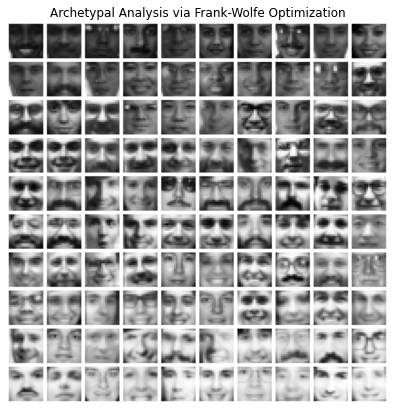

In [ ]:
fig = plt.figure(figsize=(10, 7)) 
plt.imshow(image, cmap='gray')
plt.axis('off')
plt.title("Archetypal Analysis via Frank-Wolfe Optimization")
plt.show()

---
## Exercise 4 - Archetypes as memories

In this task you need the matrices $A \in\mathbb{R}^{m\times k}$ computed in the previous task
and a single column $x\in \mathbb{R}^m$ of the (un-truncated) data matrix $X\in\mathbb{R}^{m\times n}$ we considered before. To accomplish this, you may use something like this

In [ ]:
matA = np.load(matrix_A_path + ".npy").astype('float')

k = 100
# k = 25

x = 2100 # x = 500

matX = np.load(data_file_path+"faceMatrix.npy").astype('float')
m, n = matX.shape
vecX = matX[:,x].reshape(m,1)

The idea we explore in this task is to consider the archetypes $a_i$ in $A$ as memories which we may use to explain a stimulus $x$. To this end, we solve the following optimization problem
$$ z^∗ = \text{argmin}_{z\in[0,1]^k} ||Az − x ||^2$$
which allows us to express the stimulus $x$ in terms of known memories $a_i$, namely as
$$ \hat{x} := Az^∗$$
In order to solve the above optimization problem, implement the following instance of the Frank-Wolfe algorithm:
- $z_0 =\frac{1}{k}\textbf{1}$
- **for** $t=0,\dots, t_\max$
    - $g = 2[A^\intercal A z_t - A^\intercal x]$
    - $i = \text{argmin}_t g_t$
    - $z_{t+1} = z_t + \frac{t}{t+2} [e_i-z_t]$    
    - $\hat{x}_{t+1}=A z_{t+1}$

This produces a sequence (or memory trace) $\hat{x}_1 , \hat{x}_2 , \dots$ of reconstructions
of the stimulus $x$ in terms of convex combinations of the archetypes $a_i$.

**Note**: In the code we rearranged the update of z:
$$\begin{align} z_{t+1} &\leftarrow z_t + \frac{t}{t+2} e_i - \frac{t}{t+2} z_t \\
&= \frac{t}{t+2} e_i + \frac{t+2}{t+2}z_t - \frac{t}{t+2} z_t \\
&= \frac{t}{t+2} e_i + \frac{2}{t+2}z_t
\end{align}$$

Then with $\beta = \frac{2}{t+2}$ its is $1-\beta = \frac{t}{t+2}$ we would perfrom:

$ z_{t} \leftarrow \beta z_t$ and then

$ {z_{t}}_i \leftarrow {z_t}_i + \big(1 - \beta\big)$

Unfortunately, this was a MISTAKE in the given pseudocode! The update is instead scaled by $\frac{t}{t+2}$ and thus we have to set:

$ z_{t} \leftarrow \big(1 - \beta\big) z_t$ and then

$ {z_{t}}_i \leftarrow {z_t}_i + \beta$

In [ ]:
def fwReconstructX(matA, vecX, tmax=20):
    m, k = matA.shape

    vecC = vecX.T @ matA
    vecZ = np.ones(k) / k # z_0
    # Accululate the sequence (memory trace) in the matrix R
    matR = np.zeros((m,tmax))

    for t in range(tmax):
        beta = 2. / (t+2)
        grad = 2. * (matA.T @ (matA @ vecZ) - vecC) # g

        imin = np.argmin(grad)

        vecZ *= (1-beta)
        vecZ[imin] += beta

        # Reconstruct the stimulus and store it in R
        matR[:,t] = matA @ vecZ
        
    return matR

In [ ]:
matR = fwReconstructX(matA, vecX)
m, n = matR.shape

In [ ]:
n_images = n
n_col = n_images
n_row = 1

images_R = showImages(matR, n_col, n_row, fname=f"t5-4-x{x}-k{k}.png")
image_A = showImages(vecX, 1, 1, fname=f"t5-4-input-x{x}.png")

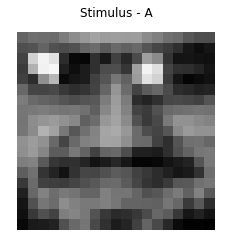

In [ ]:
plt.imshow(image_A, cmap='gray')
plt.axis('off')
plt.title("Stimulus - A")
plt.show()

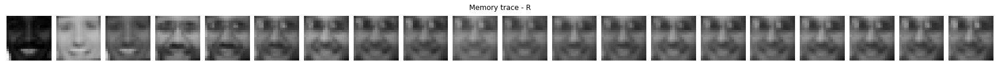

In [ ]:
plt.figure(figsize=(30,30))
plt.imshow(images_R, cmap='gray')
plt.axis('off')
plt.title("Memory trace - R")
plt.show()

---
## Exercise 5 - Information theoretic vector quantization

In the Data folder for this exercise, you will find the file `TwoMoons2D.csv` which contains a data matrix $X$ whose $n = 200$ columns $x_j$ represent 2D data points. To read this matrix into memory, you may use

In [ ]:
matX = np.loadtxt(data_file_path+"TwoMoons2D.csv", delimiter=', ')
m, n = matX.shape

When we discussed vector quantization, i.e. the problem of representing a data set
$$ X \subset\mathbb{R}^m,\quad |X| = n $$
in terms of a set of prototypes
$$ Y \subset\mathbb{R}^m,\quad |X| = k \ll n $$
we saw that a possible approach towards solving this problem consists in trying to align the densities $p_X(x)$ and $p_Y(x)$. A rather “simple” family of algorithms for this purpose is available, if we model the data- and prototype
densities in terms of radial basis functions
$$ p_X(x)= \frac{1}{n} \sum\limits_{j=1}^{n} K(x,x_j) $$
and
$$ p_Y(x)= \frac{1}{k} \sum\limits_{i=1}^{n} K(x,y_i) $$
where
$$ K(a,b)= \frac{1}{(2\pi \sigma^2)^{\frac{m}{2}} } \exp\Big( -\frac{||a-b||^2}{2\sigma^2} \Big)
$$
denotes a Gaussian kernel with variance parameter $\sigma^2$.

One of the algorithms in the family of information theoretic approaches towards vector quantization was based on the idea of trying to minimize the mean discrepancy between of the feature space means of data points and prototypes. Expressed in pseudocode it reads as follows:
- Sample $k$ columns from $X$ to initialize
$$ Y = \begin{bmatrix} y_1 & y_2 & \dots & y_k  \end{bmatrix} $$
- **for** $t=1,\dots,t_\max$ compute
    - $[K_{x,w}]_{j,u} = K(x_j,y_u)$
    - $[K_{w,w}]_{i,u} = K(y_i,y_u)$
    - $D_{x,w} = \text{diag}[\text{1}^\intercal_n K_{x,w}]$
    - $D_{w,w} = \text{diag}[\text{1}^\intercal_k K_{w,w}]$
    - update $Y = \Big[ XK_{x,w} + \frac{n}{k} Y\big[ D_{w,w} - K_{w,w} \big] \Big]D_{x,w}^{-1}$

Here is your task: Implement this algorithm in numpy and then run it to quantize the `TwoMoons2D.csv` data into $k = 20$ prototypes and plot your results.

**Note**: Your implementation could be very numpythonic in that it avoids costly matrix inversions. For inspiration, you may consult
- C. Bauckhage, [“NumPy / SciPy Recipes for Data Science: Mean Discrepancy Minimization for Vector Quantization”}(https://www.researchgate.net/publication/339486587_NumPy_SciPy_Recipes_for_Data_Science_Mean_Discrepancy_Minimization_for_Vector_Quantization), technical report, 2020

In [ ]:
def mmdMinimize(W, X, sig2, tmax=10):
    """
        1:1 translation from the code given in the paper cited above:
        "Mean Discrepancy Minimization for Vector Quantization"
    """
    m,nx = X.shape
    m,nw = W.shape

    for t in range(tmax):
        # Computation of the kernel matrices
        Kww = np.exp(-0.5 * SQEDMX(W) / sig2)     / (2*np.pi*sig2)**(m/2.)
        Kxw = np.exp(-0.5 * SQEDMXY(X, W) / sig2) / (2*np.pi*sig2)**(m/2.)

        # Compute the two 1D arrays
        colsumKww = np.sum(Kww, axis=0)
        colsumKxw = np.sum(Kxw, axis=0)
        
        # Scaling factor
        const = nx / nw

        # Terms of the update
        term1 = np.dot(X, Kxw) 
        term2 = np.dot(W, Kww) 
        term3 = W * colsumKww 
        
        # Update the codebook
        W = (term1 + const * (term3 - term2)) / colsumKxw
                                    
    return W

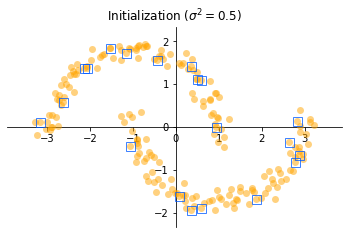

In [ ]:
k = 20

# Initialize the codebook W as a random sample drawn from the data points
matW = matX[:,rnd.choice(n,k,replace=False)]
# Plot the data and these prototypes
plotDataAndPrototypes(matX, matW, fname=f"t5-5-init-k{k}.pdf", plot_title="Initialization ($\sigma^2 = 0.5$)")

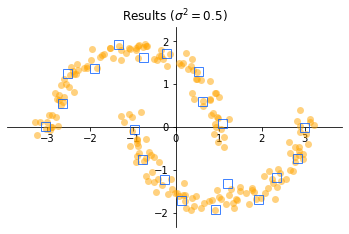

In [ ]:
# Execute the minimization
matW = mmdMinimize(matW, matX, sig2=0.5, tmax=100)
# Plot the results
plotDataAndPrototypes(matX, matW, fname=f"t5-5-result-k{k}.pdf", plot_title="Results ($\sigma^2 = 0.5$)")

---
## Exercise 6 - Hopfield nets for vector quantization

Consider the same data and basic setting as in task 5. **Hard vector quantization** is the idea of selecting $k$ appropriate prototypes from among the given data in set $X$. In other words, hard vector quantization is subset selection problem. 

It is “easy” to use information theoretic approaches to solve it. We only need to adopt our model $p_Y(x)$ for the density of the
prototypes
$$ p_Y(x) = \frac{1}{k} \sum\limits_{j=1}^{n} K(x,x_j) z_j $$

where the $z_j$ are elemetns of a binary indicator vector $z\in \{0,1\}^n$, $\textbf{1}^\intercal z=k$ which indicates if data point $x_j$ should be selected as a prototype:
$$ z_j = \begin{cases} 1 &\text{if }x_j\in Y\\
0 & \text{otherwise}  \end{cases} $$


To make a long story short, if we define an $n\times n$ kernel matrix $K$ whose entries are given by
$$ [K]_{i,j} = K(x_i, x_j)$$
the hard vector quantization problem can be formalized in terms of a binary QUBO, namely
$$ z^∗ = \text{argmin}_{z\in \{0,1\}^n} \ 
\frac{1}{k^2} z^\intercal K z - \frac{2}{nk} \textbf{1}^\intercal K z + \lambda (\textbf{1}^\intercal z-k)^2 $$

After many tedious yet altogether  straightforward algebraic manipulations,
we find an equivalent bipolar QUBO
$$ s^∗ = \text{argmin}_{s\in\{−1,+1\}^n} \ s^\intercal Qs + q^\intercal s $$
where
- $Q := \frac{1}{4} \Big[ \frac{1}{k^2} K + \lambda\textbf{1}\textbf{1}^\intercal \Big]$
- $q := \frac{1}{2} \Big[ 4 Q\textbf{1} - \big[ \frac{2}{nk} K \textbf{1} + \lambda 2 k \textbf{1} \big]\Big]$

But this is to say that hard (information theoretic) vector quantization is a
problem that can be solved by a Hopfield network.

Here is your task: Consider the $n = 200$ data points in `TwoMoons2D.csv`, let $k = 20$, and set the variance of the Gaussian kernel to $\sigma^2 = 0.5$ and the Lagrange multiplier to $\lambda = 1$. Compute $Q$ and $q$ as defined above and turn them into the parameters $W$, $\Theta$ of a Hopfield network (by now, you should now what this requires). Set the network’s initial state $s_0 = −1$ and run the
greedy neuron update mechanism for at least $t_\max = 200$ iterations. Given
the resulting final state $s^∗$ of the network, determine the set of prototypes
$$ Y = \{ x_j\in X| \ s_j^* >0 \} $$
and plot your results.

In [ ]:
matX = np.loadtxt(data_file_path+"TwoMoons2D.csv", delimiter=', ')
m, n = matX.shape

In [ ]:
# Define trivial vectors and matrices for later use
vec1 = np.ones(n)
mat1 = np.ones((n,n))

In [ ]:
# Initialise some parameters
k    = 20
sig2 = 0.5

matK = np.exp(-0.5 * SQEDMX(matX) / sig2) / (2*np.pi*sig2)**(m/2.)

l = 1.

In [ ]:
# Compute Q
matQ = 0.25 * (1/k**2 * matK + l * mat1)

# Compute q
vecQ = 0.50 * (4 * matQ @ vec1 - (2/(n*k) * matK @ vec1 + 2*l*k * vec1))

> Note that we get a suitable Hopfield network by setting the weights to $W=-2Q$ and the offset to $\Theta=q$.

In [ ]:
# Define the bias offset theta
vecT = vecQ

# Define the weight matrix
matW = -2 * matQ
# Make the weight matrix hollow
np.fill_diagonal(matW, 0)

# Define the initial state as -1
vecS_minus_one = -1 * np.ones(n)

In [ ]:
matW_init = matW.copy()
vecT_init = vecT.copy()
# Run the network
%time vecS_minus_one = hnetRunGreedy(vecS_minus_one, matW, vecT, tmax=200)

CPU times: user 8.4 ms, sys: 4.08 ms, total: 12.5 ms
Wall time: 13.5 ms


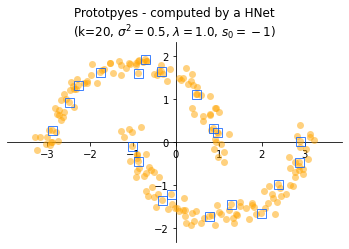

20 prototpyes were selected.


In [ ]:
# Extract set set of non-negative prototpyes...
matY = matX[:,vecS_minus_one>0]

# ...and then plot them
plot_title = f"Prototpyes - computed by a greedy-HNet\n(k={k}, $\sigma^2={sig2}$, $\lambda={l}$, $s_0={-1}$)"
plotDataAndPrototypes(matX, matY, fname=f"t5-6-result-k{k}.pdf", plot_title=plot_title)
print(f"{np.sum(vecS>0)} prototpyes were selected.")

Now proceed exactly as above, but this time let the Hopfield network start
in state $s_0 = +1$.

CPU times: user 8.69 ms, sys: 9.96 ms, total: 18.6 ms
Wall time: 12.3 ms


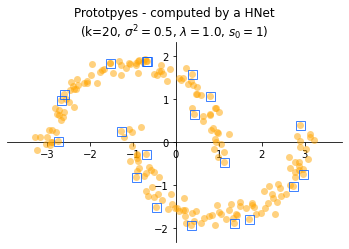

20 prototpyes were selected.


In [ ]:
# Define the initial state as +1
vecS_plus_one = np.ones(n)

# Run the network
%time vecS_plus_one = hnetRunGreedy(vecS_plus_one, matW, vecT, tmax=200)

# Extract set set of non-positive prototpyes...
# (note that the set of non-negative states yields not selected data)
matY = matX[:,vecS_plus_one>0]

# ...and then plot them
plot_title = f"Prototpyes - computed by a greedy-HNet\n(k={k}, $\sigma^2={sig2}$, $\lambda={l}$, $s_0={1}$)"
plotDataAndPrototypes(matX, matY, fname=f"t5-6-result-k{k}.pdf", plot_title=plot_title)
print(f"{np.sum(vecS>0)} prototpyes were selected.")

What do you observe? Can you explain your observation? What does your observation imply w.r.t. to the QUBO formulation of hard vector quantization? What would you observe if you would use a different neuron update mechanism?

> We notice, that the results with $s_0=+1$ yield a good spread of prototypes too.

> In contrast to the other tasks above, the solutions of the QUBO seem to not be a partitioned into two classes of solutions.

In [ ]:
# Run a HNet on the given problem for both initial states (-1, +1) for the following modes:
update_mechanisms = ['random', 'round robin', 'simulated annealing']
signs = [-1, 1]

%%%% MODE: random-HNet %%%%
CPU times: user 1.8 ms, sys: 0 ns, total: 1.8 ms
Wall time: 1.78 ms


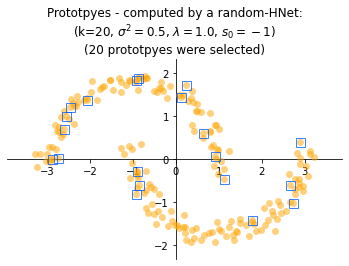

CPU times: user 2.12 ms, sys: 4 µs, total: 2.12 ms
Wall time: 3.18 ms


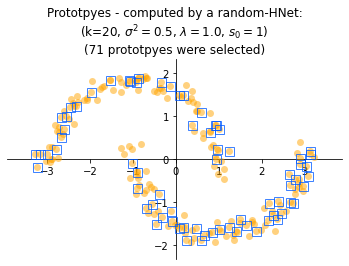

%%%%%%%%%%%%%%%%%%%%%%%%%%%


%%%% MODE: round robin-HNet %%%%
CPU times: user 233 ms, sys: 953 µs, total: 234 ms
Wall time: 237 ms


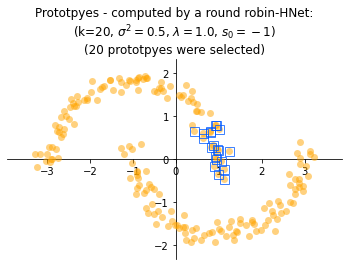

CPU times: user 241 ms, sys: 2.93 ms, total: 244 ms
Wall time: 246 ms


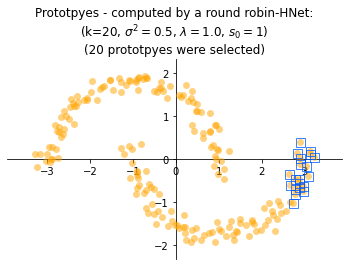

%%%%%%%%%%%%%%%%%%%%%%%%%%%


%%%% MODE: simulated annealing-HNet %%%%
CPU times: user 8.27 s, sys: 13.3 ms, total: 8.28 s
Wall time: 8.31 s


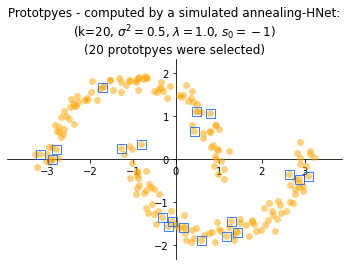

CPU times: user 8.09 s, sys: 14.5 ms, total: 8.1 s
Wall time: 8.14 s


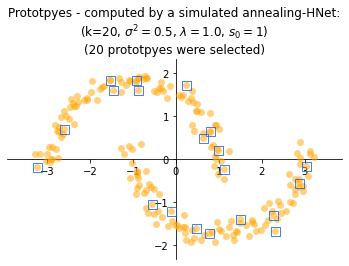

%%%%%%%%%%%%%%%%%%%%%%%%%%%




In [ ]:
for mode in update_mechanisms:
    print(f"%%%% MODE: {mode}-HNet %%%%")
    
    for sign in signs:
        vecS = sign * np.ones(n)
        %time run_hopfield_net(vecS, matW, vecT, mode, t_max=200)
        
        # Extract set set of non-negative prototpyes...
        matY = matX[:,vecS>0]        
        # ...and then plot them
        plot_title = f"Prototpyes - computed by a {mode}-HNet:"
        plot_title += f"\n(k={k}, $\sigma^2={sig2}$, $\lambda={l}$, $s_0={sign}$)"
        plot_title += f"\n({np.sum(vecS>0)} prototpyes were selected)"

        plotDataAndPrototypes(matX, matY, fname=f"t5-6-result-k{k}.pdf", plot_title=plot_title)
    
    print(f"%%%%%%%%%%%%%%%%%%%%%%%%%%%\n\n")

> We can see, that depending on the initialisation and depending on the update mode in the HNet, the results may look different. 

> This hints at the fact that there are **many local minima** and the QUBO solves a non-trivial problem.